In [1]:
!pip install opencv-contrib-python

In [2]:
import cv2 as cv
import requests
from io import BytesIO
import numpy as np

In [3]:
add='https://images.pexels.com/photos/1108099/pexels-photo-1108099.jpeg'

In [4]:
def url_img(url):
    try:
        response=requests.get(url)
        if response.status_code==200:
            image_data=BytesIO(response.content)
            im_array=np.asarray(bytearray(image_data.read()),dtype=np.uint8)
            image=cv.imdecode(im_array,cv.IMREAD_COLOR)
            return image
        else:
            print("Failed to retrieve image from URL. Status code:", response.status_code)
            return None
    except Exception as e:
        print("An error occurred:", e)
        return None

In [5]:
image=url_img(add)

In [6]:
image.shape

(3888, 5184, 3)

In [7]:
type(image)

numpy.ndarray

In [8]:
image_rgb=cv.cvtColor(image,cv.COLOR_BGR2RGB)

In [9]:
import matplotlib.pyplot as plt

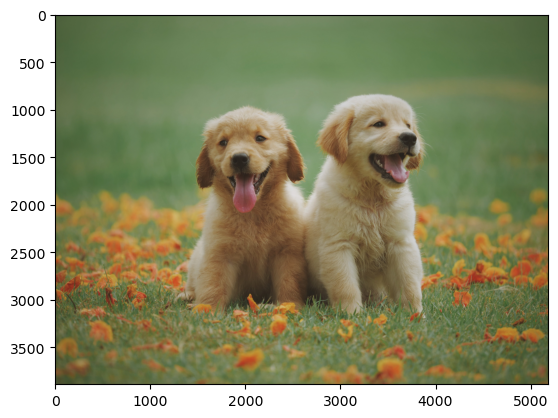

In [10]:
plt.imshow(image_rgb)

In [11]:
!pip install opencv_jupyter_ui

In [12]:
import opencv_jupyter_ui as jcv

In [13]:
def resize(image,scale_x,scale_y):
    w=int(image.shape[1]*scale_x)
    h=int(image.shape[0]*scale_y)
    dimensions=(w,h)
    return cv.resize(image,dimensions,interpolation=cv.INTER_AREA)

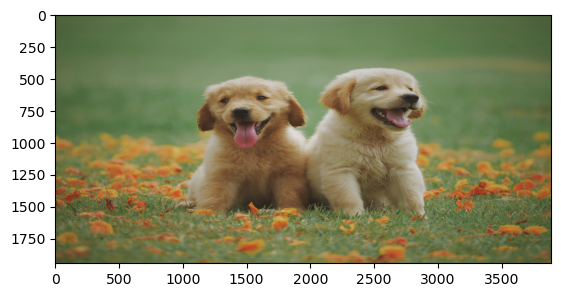

In [14]:
res_image=resize(image,0.75,0.50)
res_image_rgb=cv.cvtColor(res_image,cv.COLOR_BGR2RGB)
plt.imshow(res_image_rgb)

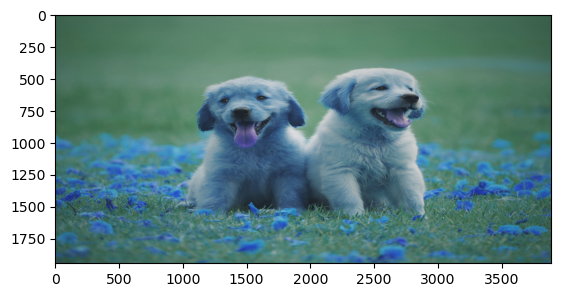

In [15]:
plt.imshow(res_image)

In [20]:
#Grayscaling

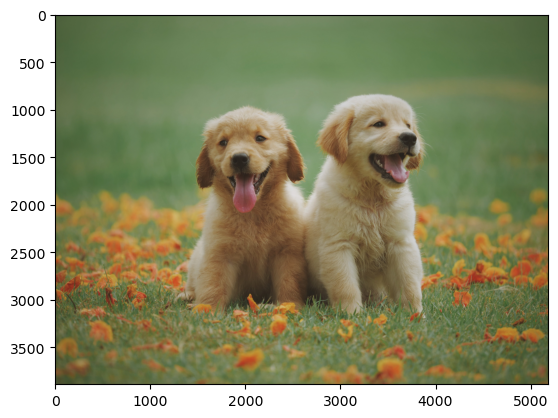

In [19]:
plt.imshow(image_rgb)

In [21]:
gray=cv.cvtColor(image,cv.COLOR_BGR2GRAY)

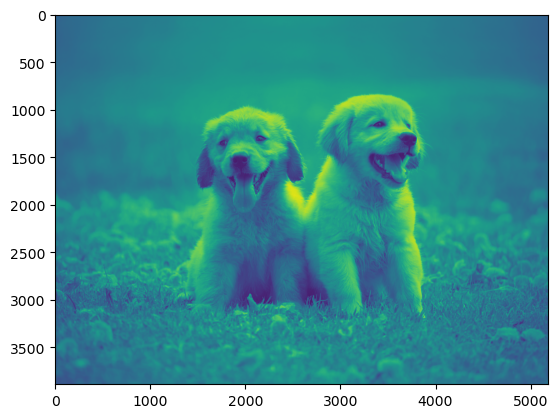

In [22]:
plt.imshow(gray)

In [23]:
dim=image.shape

In [24]:
dim

(3888, 5184, 3)

In [44]:
#Drawing and Writing
blank=np.zeros(dim,dtype='uint8')

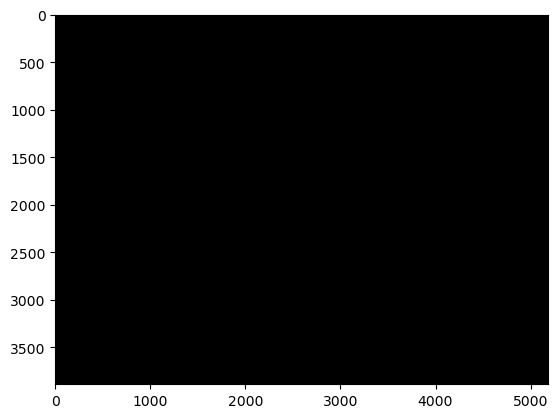

In [26]:
plt.imshow(blank)

In [32]:
rec=cv.rectangle(blank,(0,0),(2000,1500),(124,225,221),-1)

In [38]:
cir=cv.circle(blank,(2000,2000),1000,(111,111,125),-1)

In [41]:
line=cv.line(blank,(1500,1500),(3000,3000),(121,212,45),2)

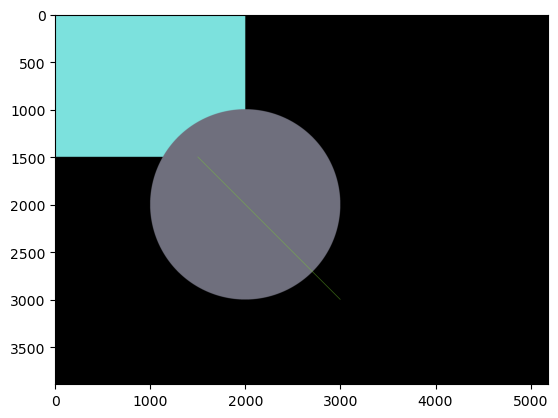

In [43]:
plt.imshow(blank)

In [63]:
#Dialation

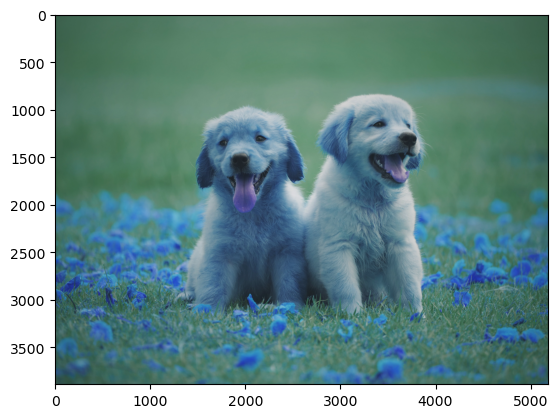

In [54]:
plt.imshow(image)

In [55]:
canny=cv.Canny(image,125,175)

In [57]:
dia=cv.dilate(canny,(2,2),iterations=5)

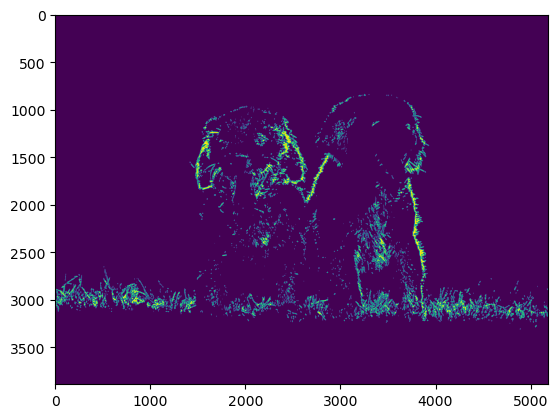

In [58]:
plt.imshow(dia)

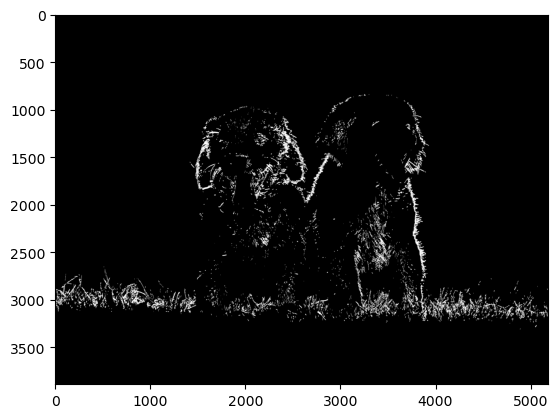

In [59]:
plt.imshow(cv.cvtColor(dia,cv.COLOR_BGR2RGB))

In [64]:
img_res=cv.resize(image,(200,200),interpolation=cv.INTER_AREA)

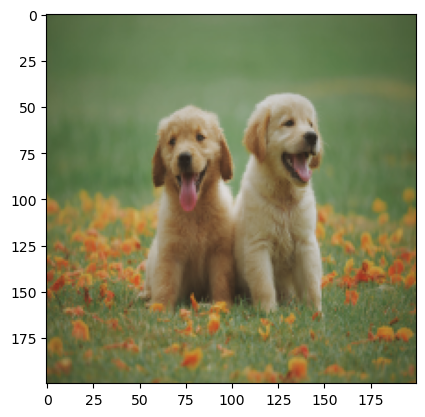

In [66]:
plt.imshow(cv.cvtColor(img_res,cv.COLOR_BGR2RGB))

In [67]:
img_res=cv.resize(image,(8000,8000),interpolation=cv.INTER_CUBIC)

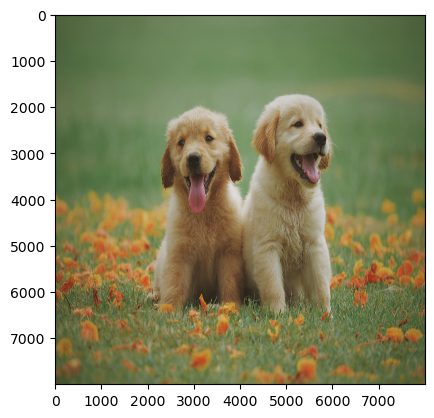

In [68]:
plt.imshow(cv.cvtColor(img_res,cv.COLOR_BGR2RGB))

In [69]:
#Translation

In [70]:
def trans(img,x,y):
    dim=(img.shape[1],img.shape[0])
    transMatrix=np.float32([[1,0,x],[0,1,y]])
    return cv.warpAffine(img,transMatrix,dim)

In [71]:
trans_image=trans(image_rgb,50,100)

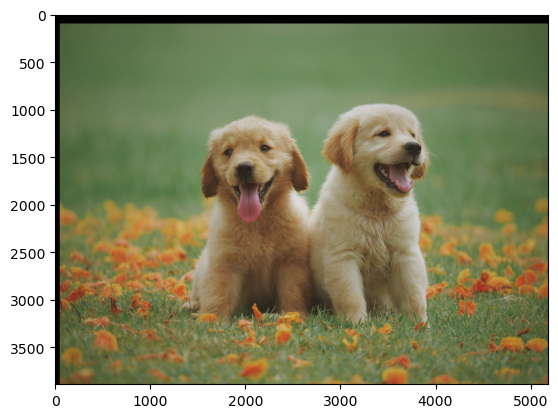

In [72]:
plt.imshow(trans_image)

In [73]:
#Rotation

In [74]:
def rotate(img,angle,rot=None):
    if rot==None:
        rot=(img.shape[1]/2,img.shape[0]/2)
    RotMatrix=cv.getRotationMatrix2D(rot,angle,1)
    dim=(img.shape[1],img.shape[0])
    return cv.warpAffine(img,RotMatrix,dim)
    

In [76]:
img_rot=rotate(image_rgb,90)

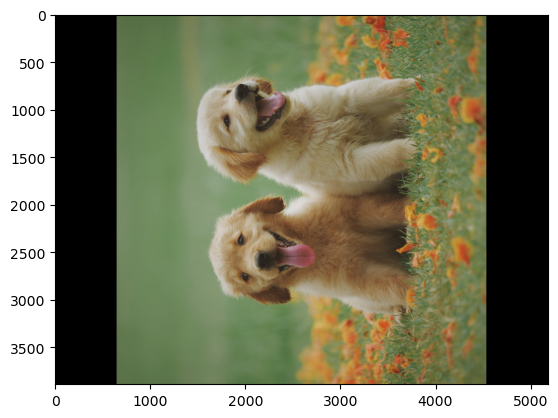

In [77]:
plt.imshow(img_rot)

In [78]:
#Flipping

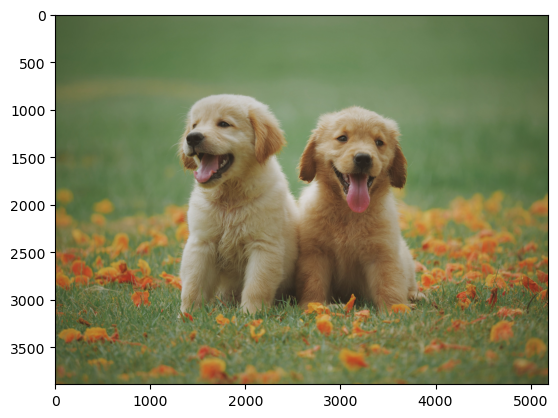

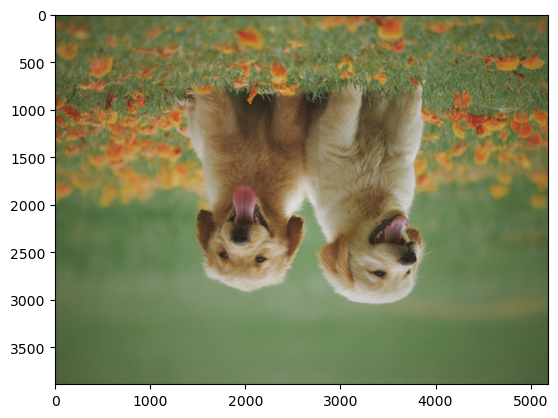

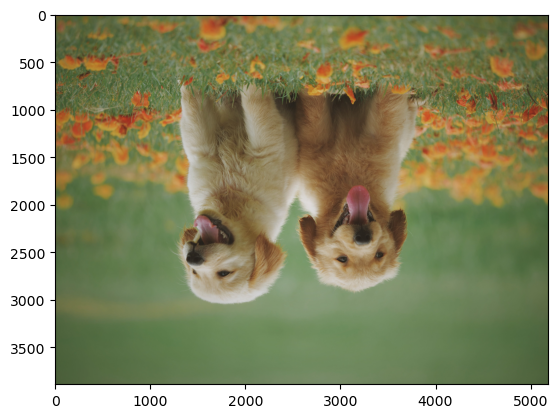

In [79]:
l=[1,0,-1]
for i in l:
    plt.imshow(cv.flip(image_rgb,i))
    plt.show()

In [80]:
#Cropping

In [85]:
crop_image=image_rgb[2500:3000,2500:4000]

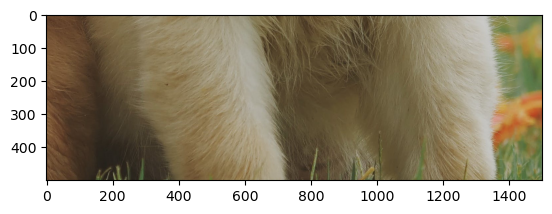

In [86]:
plt.imshow(crop_image)

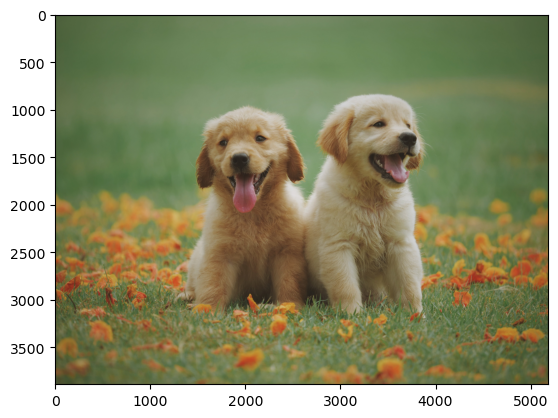

In [87]:
plt.imshow(image_rgb)

In [88]:
gray=cv.cvtColor(image,cv.COLOR_BGR2GRAY)

In [92]:
canny=cv.Canny(gray,140,150)

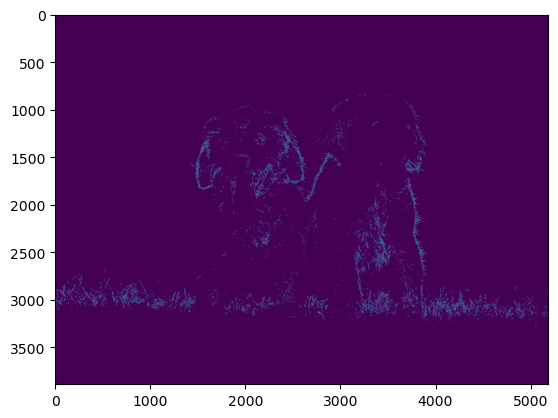

In [93]:
plt.imshow(canny)

In [94]:
contours,hierarchies=cv.findContours(canny,cv.RETR_EXTERNAL,cv.CHAIN_APPROX_NONE)

In [95]:
len(contours)

18632

In [96]:
blank=np.zeros(dim,dtype='uint8')

In [98]:
con=cv.drawContours(blank,contours,-1,(0,0,255),2)

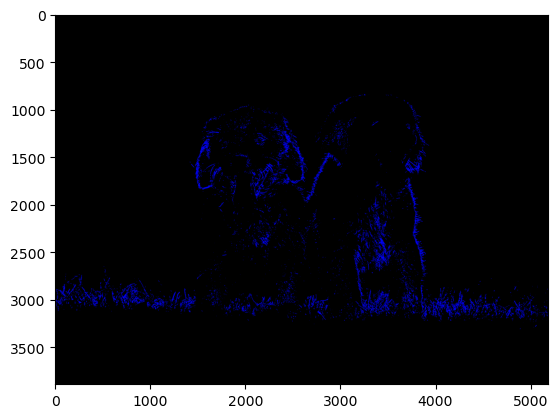

In [99]:
plt.imshow(con)

In [100]:
#Color Spaces

In [101]:
img_rgb=cv.cvtColor(image,cv.COLOR_BGR2RGB)
img_hsv=cv.cvtColor(image,cv.COLOR_BGR2HSV)
img_lab=cv.cvtColor(image,cv.COLOR_BGR2LAB)

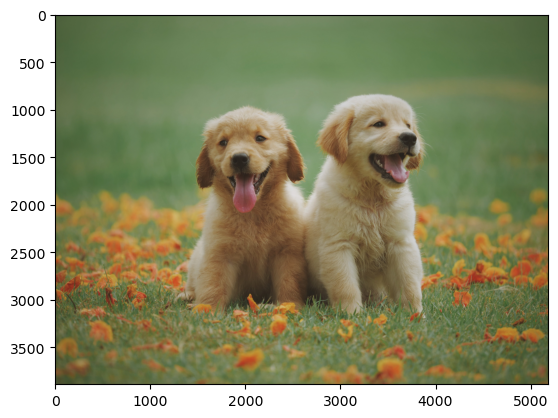

In [102]:
plt.imshow(img_rgb)

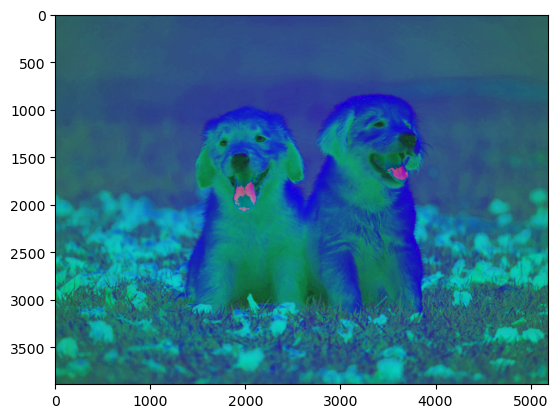

In [103]:
plt.imshow(img_hsv)

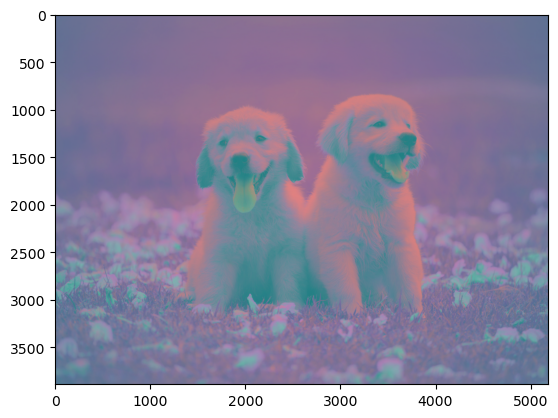

In [104]:
plt.imshow(img_lab)

In [105]:
#Color Channels

In [106]:
image.shape

(3888, 5184, 3)

In [107]:
b,g,r=cv.split(image)

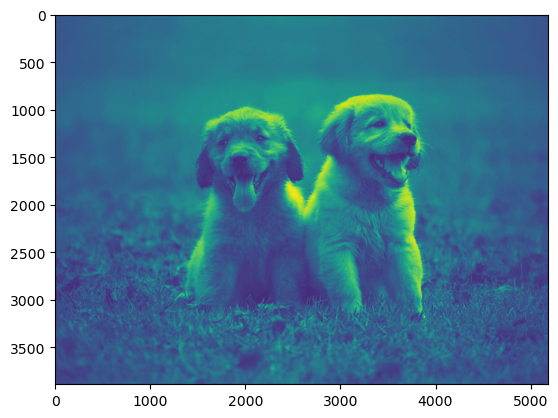

In [108]:
plt.imshow(b)

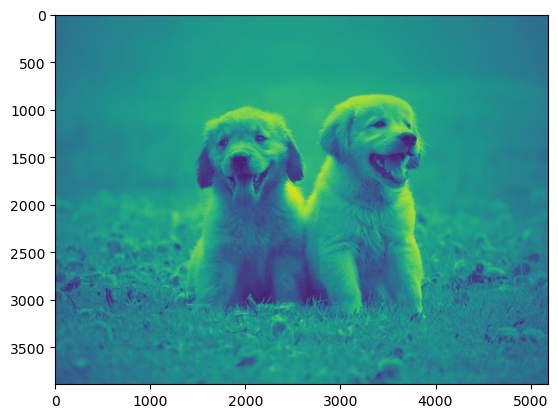

In [109]:
plt.imshow(g)

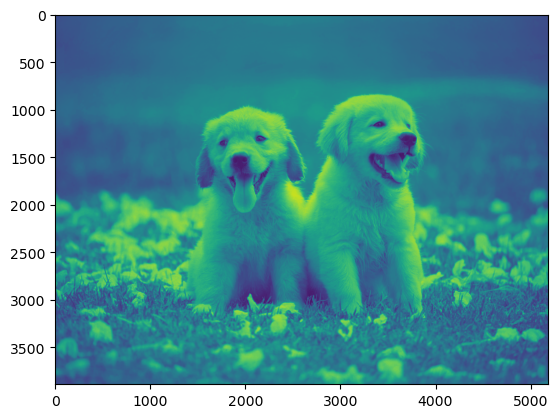

In [110]:
plt.imshow(r)

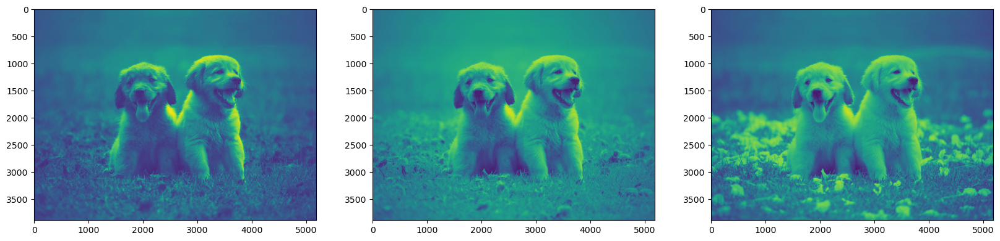

In [114]:
fig,ax=plt.subplots(1,3,figsize=(20,20))
ax[0].imshow(b)
ax[1].imshow(g)
ax[2].imshow(r)

In [115]:
#Blurring

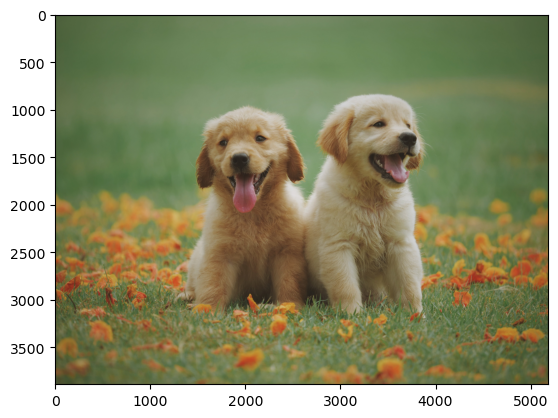

In [116]:
plt.imshow(image_rgb)

In [117]:
#Averaging, Gaussian, Median and Bilateral

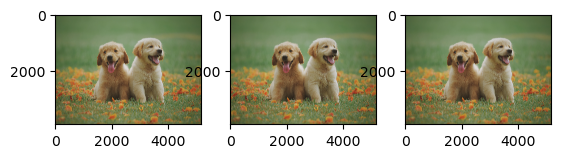

In [118]:
avg=cv.blur(image_rgb,(3,3))
avg2=cv.blur(image_rgb,(5,5))
avg3=cv.blur(image_rgb,(7,7))
fig,ax=plt.subplots(1,3)
ax[0].imshow(avg)
ax[1].imshow(avg2)
ax[2].imshow(avg3)

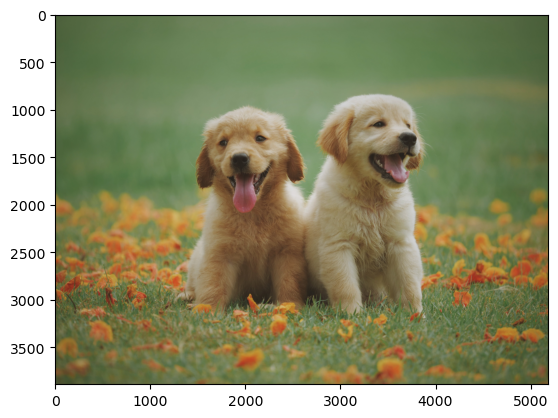

In [119]:
plt.imshow(avg)

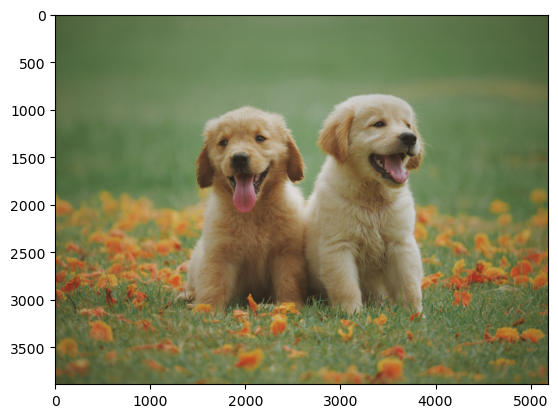

In [120]:
plt.imshow(avg2)

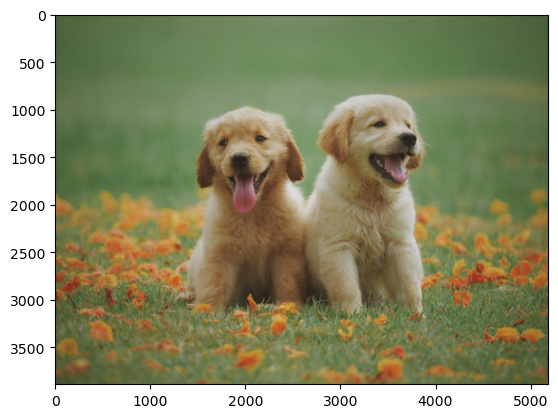

In [121]:
plt.imshow(avg3)

In [126]:
gau=cv.GaussianBlur(image_rgb,(3,3),2)
gau2=cv.GaussianBlur(image_rgb,(5,5),2)
gau3=cv.GaussianBlur(image_rgb,(7,7),2)

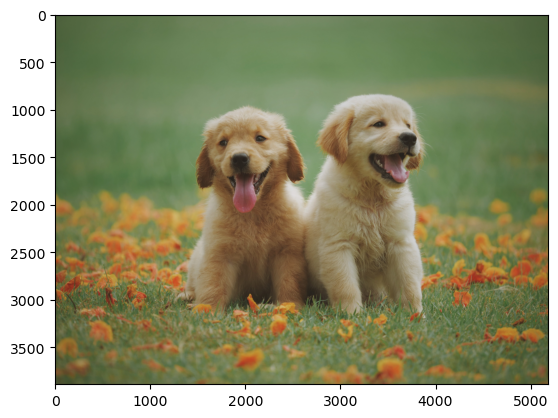

In [127]:
plt.imshow(gau)

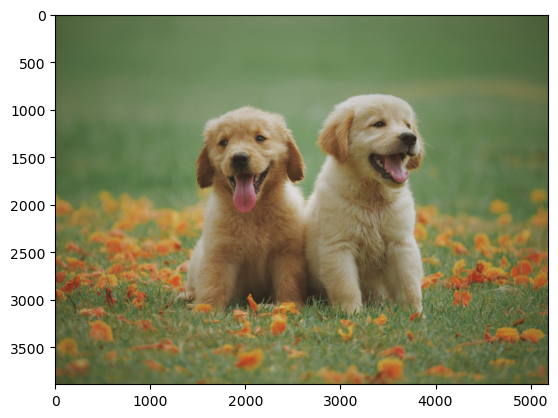

In [128]:
plt.imshow(gau2)

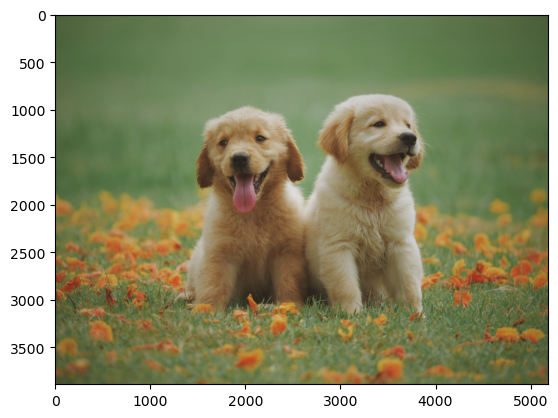

In [129]:
plt.imshow(gau3)

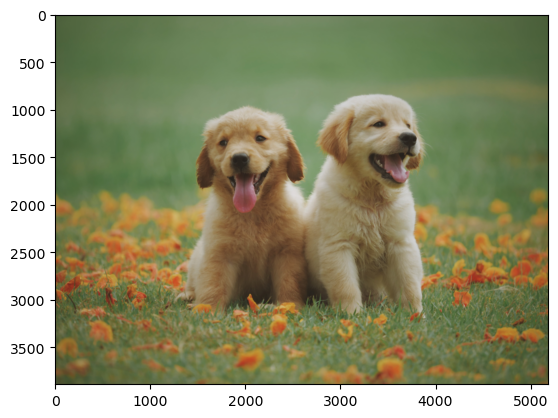

In [130]:
plt.imshow(cv.medianBlur(image_rgb,11))

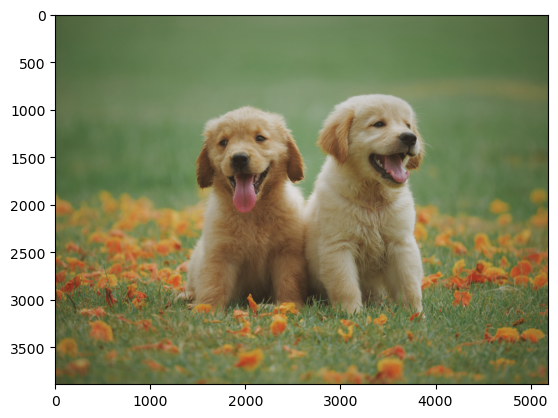

In [132]:
plt.imshow(cv.bilateralFilter(image_rgb,5,15,25))

In [134]:
#Masking

In [135]:
blank=np.zeros(dim,dtype='uint8')

In [136]:
circle=cv.circle(blank,(2000,2000),1000,(0,152,21),-1)

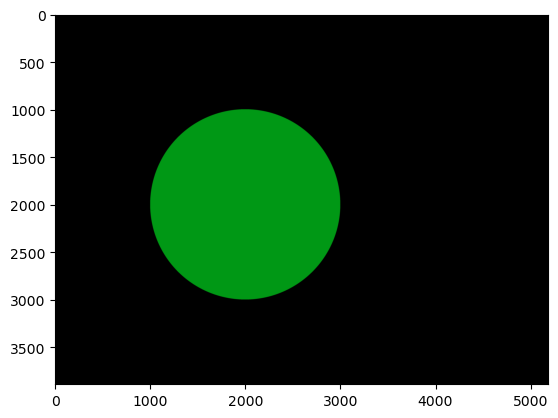

In [137]:
plt.imshow(blank)

In [146]:
blank2=np.zeros(dim,dtype='uint8')

In [147]:
rec=cv.rectangle(blank2,(0,0),(1200,1500),(121,0,0),-1)

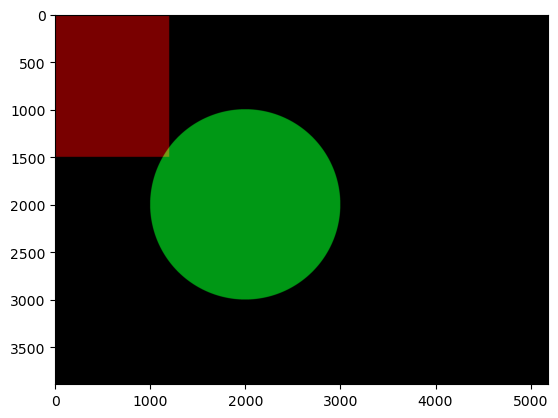

In [151]:
plt.imshow(cv.bitwise_or(circle,rec))

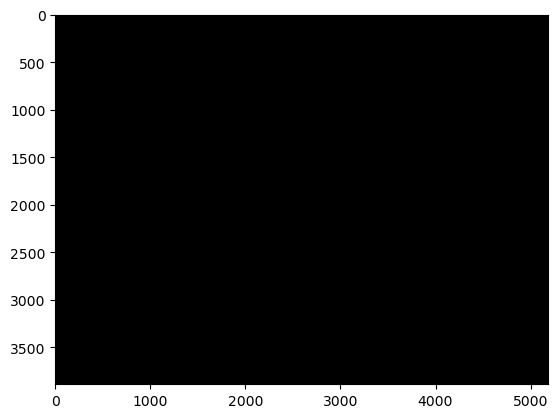

In [152]:
plt.imshow(cv.bitwise_and(circle,rec))

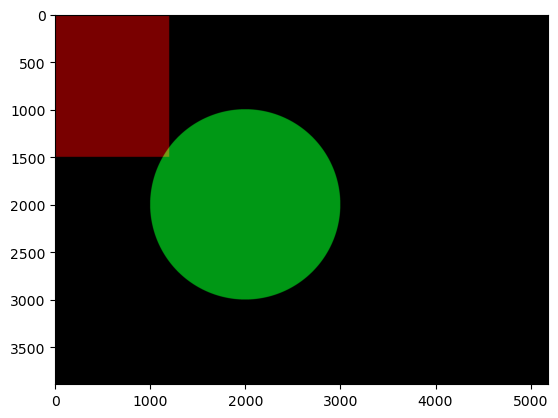

In [153]:
plt.imshow(cv.bitwise_xor(circle,rec))

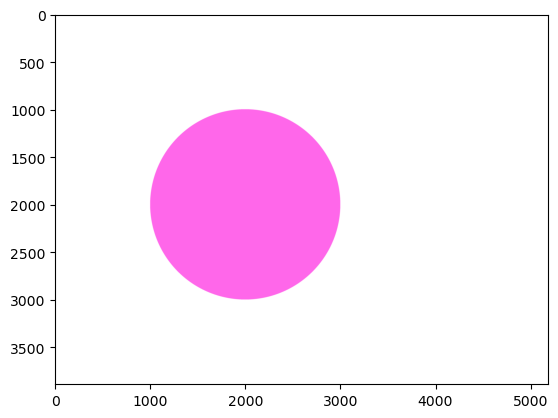

In [154]:
plt.imshow(cv.bitwise_not(circle))

In [158]:
image_uint8 = image.astype(np.uint8)
rec_uint8 = rec.astype(np.uint8)
rec_uint8 = cv.threshold(rec_uint8, 127, 255, cv.THRESH_BINARY)[1]

In [160]:
#Histogram

In [161]:
list=cv.calcHist([image],[0],None,[256],[0,256])

In [162]:
list

array([[1.20000e+01],
       [2.00000e+00],
       [6.00000e+00],
       [7.00000e+00],
       [1.00000e+01],
       [1.50000e+01],
       [2.00000e+01],
       [2.20000e+01],
       [3.50000e+01],
       [3.00000e+01],
       [6.50000e+01],
       [6.80000e+01],
       [1.04000e+02],
       [1.25000e+02],
       [1.47000e+02],
       [2.12000e+02],
       [2.58000e+02],
       [3.40000e+02],
       [4.86000e+02],
       [6.75000e+02],
       [8.58000e+02],
       [1.15300e+03],
       [1.53000e+03],
       [2.21300e+03],
       [2.89900e+03],
       [4.58100e+03],
       [7.44900e+03],
       [1.25720e+04],
       [1.90800e+04],
       [2.41250e+04],
       [3.32440e+04],
       [3.54170e+04],
       [3.96040e+04],
       [4.26170e+04],
       [4.55900e+04],
       [5.04170e+04],
       [5.65010e+04],
       [6.52390e+04],
       [7.42280e+04],
       [8.31340e+04],
       [9.15580e+04],
       [9.72220e+04],
       [1.03947e+05],
       [1.12038e+05],
       [1.21435e+05],
       [1.

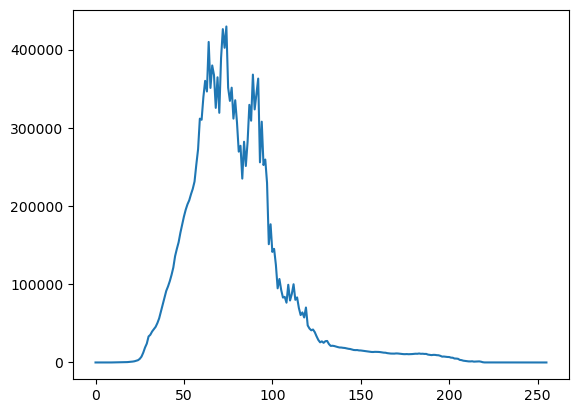

In [163]:
plt.plot(list)

In [164]:
list=cv.calcHist([image],[2],None,[256],[0,256])

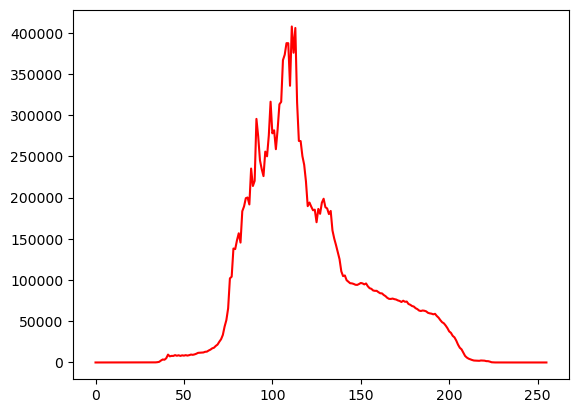

In [166]:
plt.plot(list,c='r')

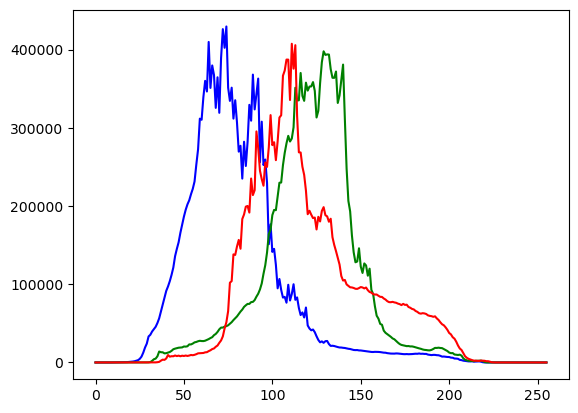

In [167]:
c=['b','g','r']
for i,col in enumerate(c):
    l=cv.calcHist([image],[i],None,[256],[0,256])
    plt.plot(l,c=col)

In [168]:
#Thresholding of an image

In [169]:
#SIMPLE AND ADAPTIVE

In [170]:
threshold,thresh=cv.threshold(gray,150,255,cv.THRESH_BINARY)

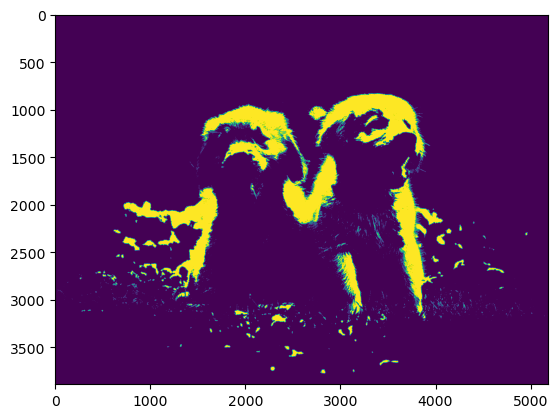

In [171]:
plt.imshow(thresh)

In [173]:
thresh_adp=cv.adaptiveThreshold(gray,255,cv.ADAPTIVE_THRESH_MEAN_C,cv.THRESH_BINARY,9,2)

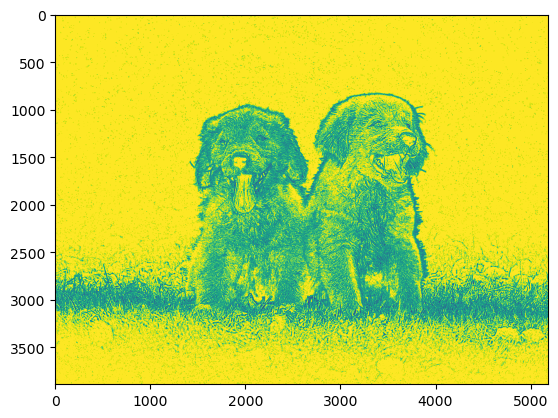

In [174]:
plt.imshow(thresh_adp)

In [175]:
#Edge Detection

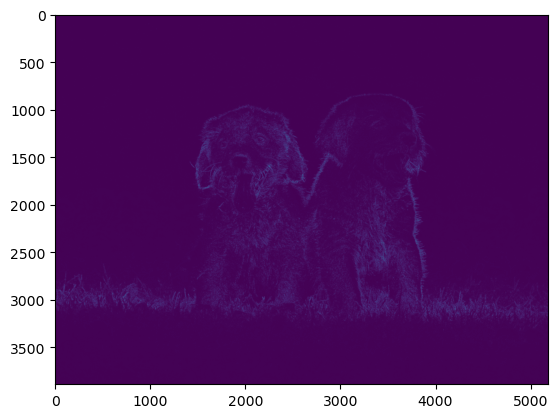

In [176]:
lap=cv.Laplacian(gray,cv.CV_64F)
lap=np.uint8(np.absolute(lap))
plt.imshow(lap)

In [177]:
#Sobel_Method

In [184]:
sob_x=cv.Sobel(gray,cv.CV_64F,1,0)
sob_y=cv.Sobel(gray,cv.CV_64F,0,1)
com=cv.bitwise_or(sob_x,sob_y)

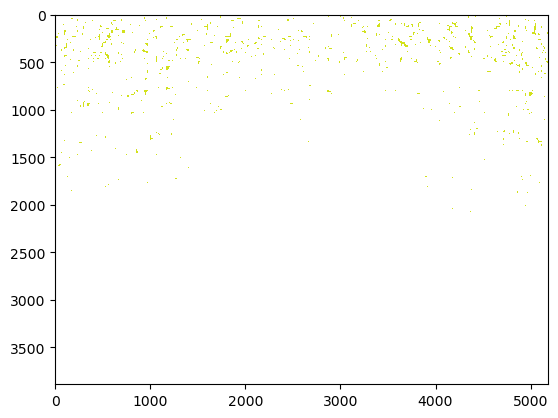

In [185]:
plt.imshow(com)

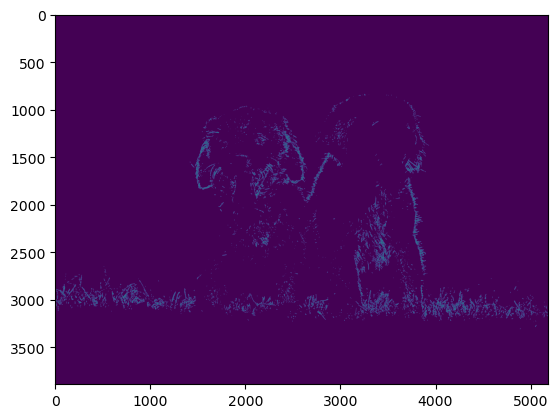

In [186]:
plt.imshow(cv.Canny(gray,125,175))